# Location-Based Recommendations
Recommendation systems are widely utilized in different applications for predicting the preference or rating of a user in a product or service. Most likely you have come across or interacted with some type of recommender systems in the past few minutes or hours in your online presence.
These Recommender systems can be of different types and the most prominent ones include Content-based filtering and Collaborative filtering. In this article, we will study location-based recommendations, where we specifically focus on geographic locations to render more relevant recommendations utilizing the location of the users. To illustrate the crucial aspects of location-based recommenders we will perform a simple Location-based recommendation using the K-Means algorithm with Yelp Dataset from Kaggle.

### Datset

This dataset is a subset of Yelp's businesses, reviews, and user data. It was originally put together for the Yelp Dataset Challenge which is a chance for students to conduct research or analysis on Yelp's data and share their discoveries. In the most recent dataset you'll find information about businesses across 8 metropolitan areas in the USA and Canada. The Data can be dowloanded from here

https://www.kaggle.com/datasets/yelp-dataset/yelp-dataset?select=yelp_academic_dataset_business.json

In [1]:
import pandas as pd 
import numpy as np

import matplotlib.pyplot as plt
import seaborn as sns

import folium

import plotly 
import plotly.offline as py
import plotly.graph_objs as go
import plotly_express as px

from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

import warnings
warnings.filterwarnings('ignore')

In [2]:
df = pd.read_json('yelp_academic_dataset_business.json', lines=True)
df.head()

,business_id,name,address,city,state,postal_code,latitude,longitude,stars,review_count,is_open,attributes,categories,hours
0,1SWheh84yJXfytovILXOAQ,Arizona Biltmore Golf Club,2818 E Camino Acequia Drive,Phoenix,AZ,85016,33.522143,-112.018481,3.0,5,0,{'GoodForKids': 'False'},"Golf, Active Life",None
1,QXAEGFB4oINsVuTFxEYKFQ,Emerald Chinese Restaurant,30 Eglinton Avenue W,Mississauga,ON,L5R 3E7,43.605499,-79.652289,2.5,128,1,"{'RestaurantsReservations': 'True', 'GoodForMe...","Specialty Food, Restaurants, Dim Sum, Imported...","{'Monday': '9:0-0:0', 'Tuesday': '9:0-0:0', 'W..."
2,gnKjwL_1w79qoiV3IC_xQQ,Musashi Japanese Restaurant,"10110 Johnston Rd, Ste 15",Charlotte,NC,28210,35.092564,-80.859132,4.0,170,1,"{'GoodForKids': 'True', 'NoiseLevel': 'u'avera...","Sushi Bars, Restaurants, Japanese","{'Monday': '17:30-21:30', 'Wednesday': '17:30-..."
3,xvX2CttrVhyG2z1dFg_0xw,Farmers Insurance - Paul Lorenz,"15655 W Roosevelt St, Ste 237",Goodyear,AZ,85338,33.455613,-112.395596,5.0,3,1,None,"Insurance, Financial Services","{'Monday': '8:0-17:0', 'Tuesday': '8:0-17:0', ..."
4,HhyxOkGAM07SRYtlQ4wMFQ,Queen City Plumbing,"4209 Stuart Andrew Blvd, Ste F",Charlotte,NC,28217,35.190012,-80.887223,4.0,4,1,"{'BusinessAcceptsBitcoin': 'False', 'ByAppoint...","Plumbing, Shopping, Local Services, Home Servi...","{'Monday': '7:0-23:0', 'Tuesday': '7:0-23:0', ..."


In [3]:
df.shape

(192609, 14)

In [4]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
latitude,192609.0,38.541803,4.941964,33.204642,33.637408,36.144815,43.602989,51.299943
longitude,192609.0,-97.594785,16.697725,-115.493471,-112.274677,-111.759323,-79.983614,-72.911982
stars,192609.0,3.585627,1.018458,1.000000,3.000000,3.500000,4.500000,5.000000
review_count,192609.0,33.538962,110.135224,3.000000,4.000000,9.000000,25.000000,8348.000000
is_open,192609.0,0.823040,0.381635,0.000000,1.000000,1.000000,1.000000,1.000000


Filtering categories with resturants only

In [8]:
df['Restaurants'] = df['categories'].str.contains('Restaurants')
df.head()

,business_id,name,address,city,state,postal_code,latitude,longitude,stars,review_count,is_open,attributes,categories,hours,Restaurants
0,1SWheh84yJXfytovILXOAQ,Arizona Biltmore Golf Club,2818 E Camino Acequia Drive,Phoenix,AZ,85016,33.522143,-112.018481,3.0,5,0,{'GoodForKids': 'False'},"Golf, Active Life",None,False
1,QXAEGFB4oINsVuTFxEYKFQ,Emerald Chinese Restaurant,30 Eglinton Avenue W,Mississauga,ON,L5R 3E7,43.605499,-79.652289,2.5,128,1,"{'RestaurantsReservations': 'True', 'GoodForMe...","Specialty Food, Restaurants, Dim Sum, Imported...","{'Monday': '9:0-0:0', 'Tuesday': '9:0-0:0', 'W...",True
2,gnKjwL_1w79qoiV3IC_xQQ,Musashi Japanese Restaurant,"10110 Johnston Rd, Ste 15",Charlotte,NC,28210,35.092564,-80.859132,4.0,170,1,"{'GoodForKids': 'True', 'NoiseLevel': 'u'avera...","Sushi Bars, Restaurants, Japanese","{'Monday': '17:30-21:30', 'Wednesday': '17:30-...",True
3,xvX2CttrVhyG2z1dFg_0xw,Farmers Insurance - Paul Lorenz,"15655 W Roosevelt St, Ste 237",Goodyear,AZ,85338,33.455613,-112.395596,5.0,3,1,None,"Insurance, Financial Services","{'Monday': '8:0-17:0', 'Tuesday': '8:0-17:0', ...",False
4,HhyxOkGAM07SRYtlQ4wMFQ,Queen City Plumbing,"4209 Stuart Andrew Blvd, Ste F",Charlotte,NC,28217,35.190012,-80.887223,4.0,4,1,"{'BusinessAcceptsBitcoin': 'False', 'ByAppoint...","Plumbing, Shopping, Local Services, Home Servi...","{'Monday': '7:0-23:0', 'Tuesday': '7:0-23:0', ...",False


In [9]:
df_restaurants = df.loc[df.Restaurants == True]
df_restaurants.head()

,business_id,name,address,city,state,postal_code,latitude,longitude,stars,review_count,is_open,attributes,categories,hours,Restaurants
1,QXAEGFB4oINsVuTFxEYKFQ,Emerald Chinese Restaurant,30 Eglinton Avenue W,Mississauga,ON,L5R 3E7,43.605499,-79.652289,2.5,128,1,"{'RestaurantsReservations': 'True', 'GoodForMe...","Specialty Food, Restaurants, Dim Sum, Imported...","{'Monday': '9:0-0:0', 'Tuesday': '9:0-0:0', 'W...",True
2,gnKjwL_1w79qoiV3IC_xQQ,Musashi Japanese Restaurant,"10110 Johnston Rd, Ste 15",Charlotte,NC,28210,35.092564,-80.859132,4.0,170,1,"{'GoodForKids': 'True', 'NoiseLevel': 'u'avera...","Sushi Bars, Restaurants, Japanese","{'Monday': '17:30-21:30', 'Wednesday': '17:30-...",True
11,1Dfx3zM-rW4n-31KeC8sJg,Taco Bell,2450 E Indian School Rd,Phoenix,AZ,85016,33.495194,-112.028588,3.0,18,1,"{'RestaurantsTakeOut': 'True', 'BusinessParkin...","Restaurants, Breakfast & Brunch, Mexican, Taco...","{'Monday': '7:0-0:0', 'Tuesday': '7:0-0:0', 'W...",True
13,fweCYi8FmbJXHCqLnwuk8w,Marco's Pizza,5981 Andrews Rd,Mentor-on-the-Lake,OH,44060,41.708520,-81.359556,4.0,16,1,"{'RestaurantsPriceRange2': '2', 'BusinessAccep...","Italian, Restaurants, Pizza, Chicken Wings","{'Monday': '10:0-0:0', 'Tuesday': '10:0-0:0', ...",True
17,PZ-LZzSlhSe9utkQYU8pFg,Carluccio's Tivoli Gardens,"1775 E Tropicana Ave, Ste 29",Las Vegas,NV,89119,36.100016,-115.128529,4.0,40,0,"{'OutdoorSeating': 'False', 'BusinessAcceptsCr...","Restaurants, Italian",None,True


In [10]:
df_restaurants.shape

(59371, 15)

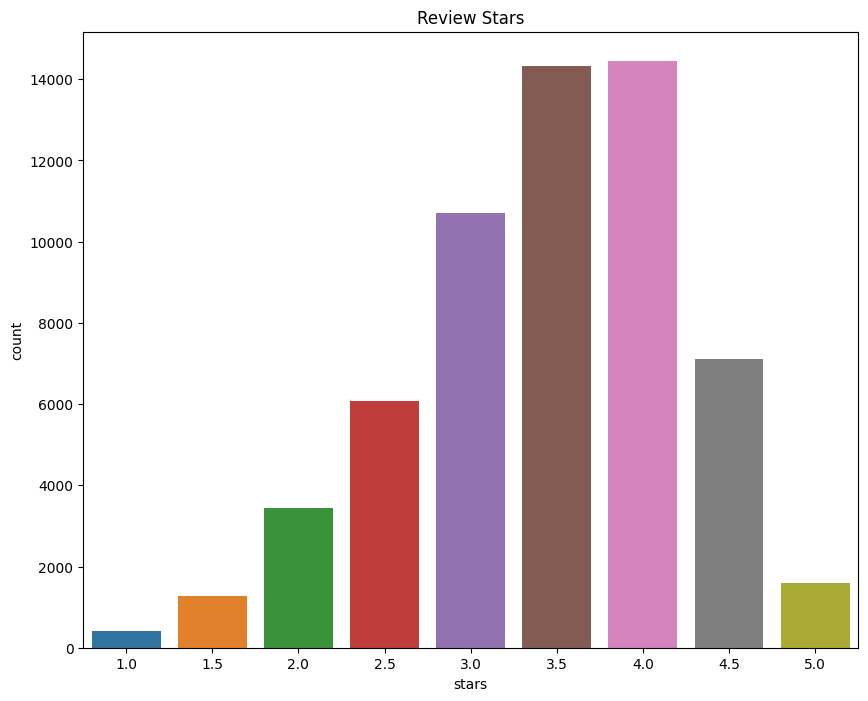

In [11]:
fig, ax = plt.subplots(figsize=(10,8))
sns.countplot(df_restaurants['stars'], ax=ax)
plt.title('Review Stars')
# plt.savefig('stars.png')
plt.show()

In [12]:
top_restaurants = df_restaurants.sort_values(by=['review_count', 'stars'], ascending=False)[:20]
top_restaurants.head()

,business_id,name,address,city,state,postal_code,latitude,longitude,stars,review_count,is_open,attributes,categories,hours,Restaurants
82250,4JNXUYY8wbaaDmk3BPzlWw,Mon Ami Gabi,3655 Las Vegas Blvd S,Las Vegas,NV,89109,36.112859,-115.172434,4.0,8348,1,"{'Corkage': 'True', 'RestaurantsDelivery': 'Fa...","Food, French, Breakfast & Brunch, Restaurants,...","{'Monday': '7:0-23:0', 'Tuesday': '7:0-23:0', ...",True
89206,RESDUcs7fIiihp38-d6_6g,Bacchanal Buffet,3570 S Las Vegas Blvd,Las Vegas,NV,89109,36.116113,-115.176222,4.0,8339,1,"{'NoiseLevel': 'u'average'', 'HasTV': 'False',...","Restaurants, Buffets, Sandwiches, Food, Breakf...","{'Monday': '7:30-22:0', 'Tuesday': '7:30-22:0'...",True
35199,K7lWdNUhCbcnEvI0NhGewg,Wicked Spoon,3708 Las Vegas Blvd S,Las Vegas,NV,89109,36.109550,-115.176155,3.5,6708,1,"{'GoodForKids': 'True', 'RestaurantsPriceRange...","Buffets, Breakfast & Brunch, Restaurants","{'Monday': '8:0-21:0', 'Tuesday': '8:0-21:0', ...",True
58852,f4x1YBxkLrZg652xt2KR5g,Hash House A Go Go,3535 Las Vegas Blvd,Las Vegas,NV,89109,36.118181,-115.171580,4.0,5763,1,"{'BusinessAcceptsCreditCards': 'True', 'Restau...","Breakfast & Brunch, Food, Restaurants, America...","{'Monday': '0:0-0:0', 'Tuesday': '0:0-0:0', 'W...",True
141820,cYwJA2A6I12KNkm2rtXd5g,Gordon Ramsay BurGR,3667 Las Vegas Blvd S,Las Vegas,NV,89109,36.110724,-115.172169,4.0,5484,0,"{'RestaurantsGoodForGroups': 'True', 'Alcohol'...","Restaurants, Burgers, American (Traditional)","{'Monday': '11:0-0:0', 'Tuesday': '11:0-0:0', ...",True


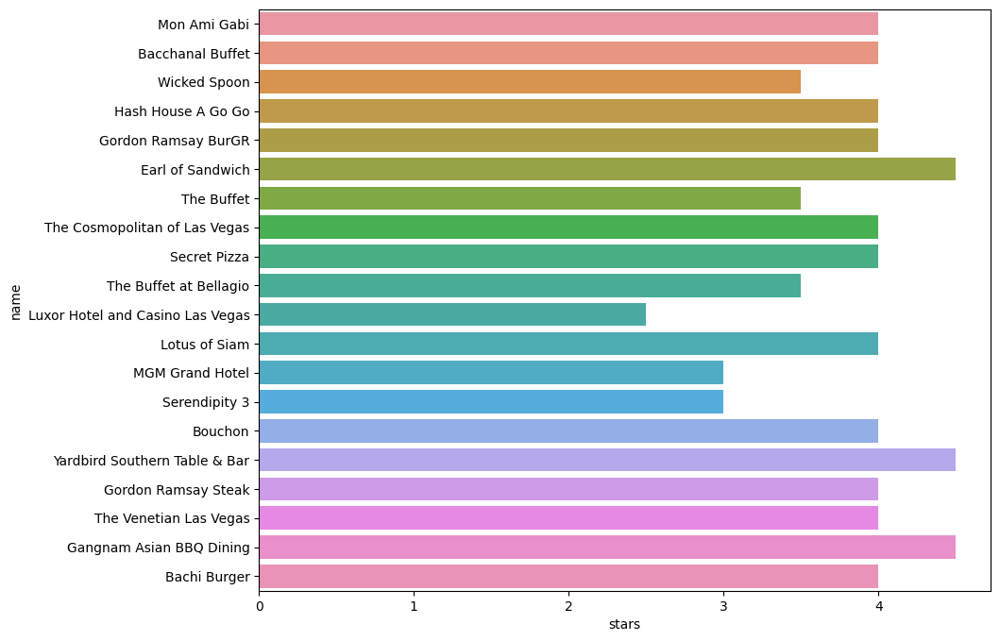

In [14]:
fig, ax = plt.subplots(figsize=(10, 8))
sns.barplot(x = 'stars', y = 'name', data=top_restaurants, ax= ax);
plt.show()

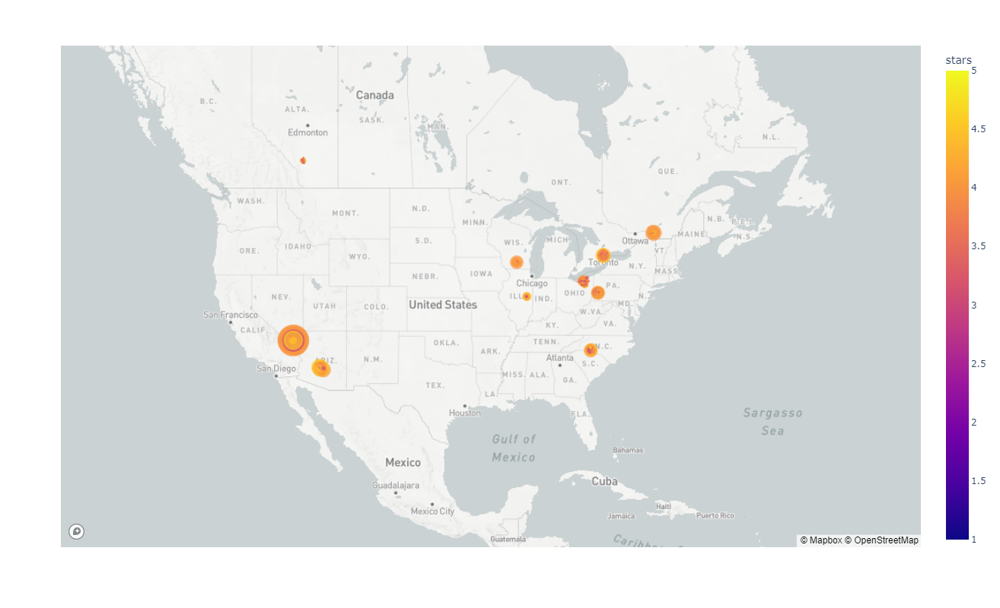

In [15]:
px.set_mapbox_access_token("pk.eyJ1Ijoic2lkZHAyNzQiLCJhIjoiY2txZHM2bjdyMDd6bjJvbWxkcG5odW5zNCJ9.SZll1uNjsTQ-IdGd1n7zCw")
#configure_plotly_browser_state()
px.scatter_mapbox(df_restaurants, lat="latitude", lon="longitude", color="stars", size='review_count' ,
                   size_max=30, zoom=3, width=1200, height=800)

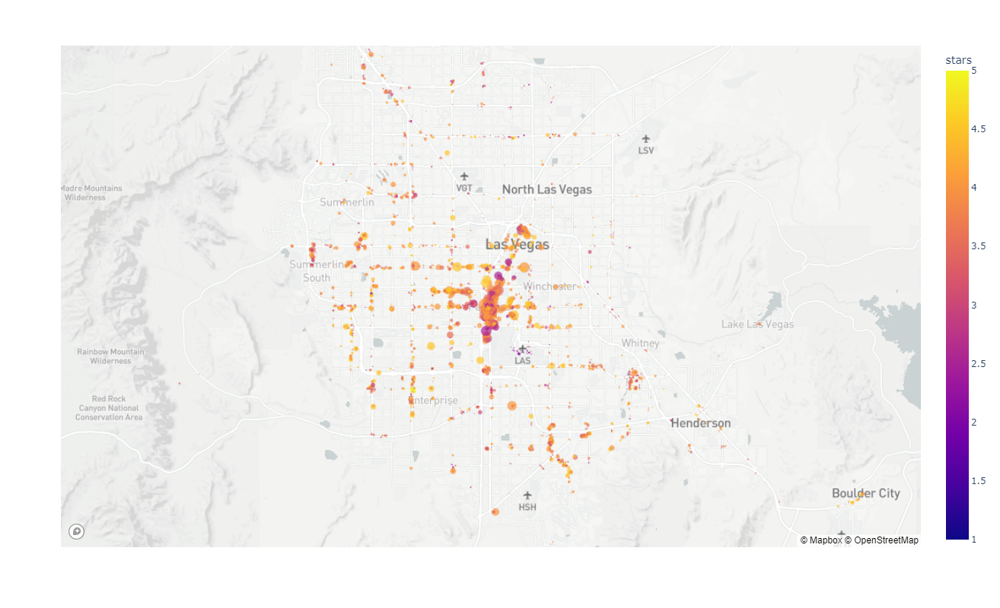

In [16]:
lasVegas = df_restaurants[df_restaurants.state == 'NV']
px.scatter_mapbox(lasVegas, lat="latitude", lon="longitude", color="stars", size='review_count' ,
                   size_max=15, zoom=10, width=1200, height=800)

## K-Means Clustering

### Determing the number of clusters (K)

In [17]:
# Elbow method to determine the number of K in Kmeans Clustering
coords = lasVegas[['longitude','latitude']]

distortions = []
K = range(1,25)
for k in K:
    kmeansModel = KMeans(n_clusters=k)
    kmeansModel = kmeansModel.fit(coords)
    distortions.append(kmeansModel.inertia_)



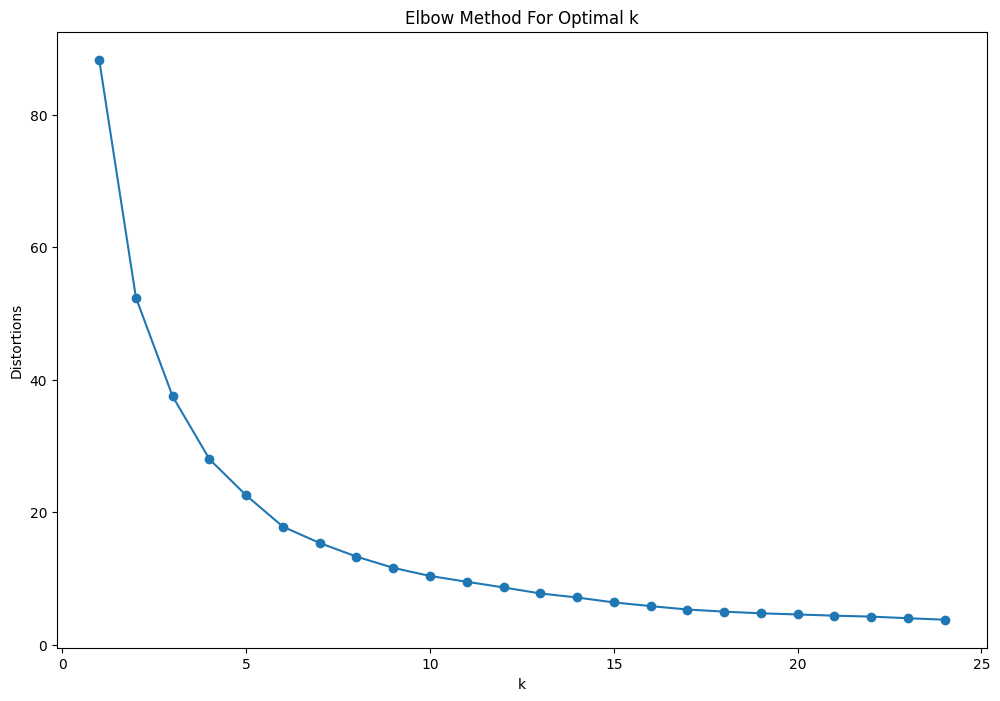

In [18]:
fig, ax = plt.subplots(figsize=(12, 8))
plt.plot(K, distortions, marker='o')
plt.xlabel('k')
plt.ylabel('Distortions')
plt.title('Elbow Method For Optimal k')
# plt.savefig('elbow.png')
plt.show()

## Silhoute method


In [20]:
from sklearn.metrics import silhouette_score

sil = []
kmax = 50

# dissimilarity would not be defined for a single cluster, thus, minimum number of clusters should be 2
for k in range(2, kmax+1):
    kmeans = KMeans(n_clusters = k).fit(coords)
    labels = kmeans.labels_
    sil.append(silhouette_score(coords, labels, metric = 'euclidean'))

In [21]:
sil

[0.38403035415086556,
 0.36693867090132565,
 0.3879222112166308,
 0.3889928471944808,
 0.4089980230330813,
 0.41659326892299725,
 0.42505833142419286,
 0.40467936256964865,
 0.40631134249525047,
 0.4177132224049928,
 0.42507101388664265,
 0.4282766157164024,
 0.4300033495541041,
 0.43109559665578956,
 0.43871160487412464,
 0.44591375456324495,
 0.43979857154186114,
 0.4462813515880473,
 0.432139654835508,
 0.43833568097228526,
 0.44680211713800977,
 0.44649621505061327,
 0.43552321976477393,
 0.4354399250500395,
 0.4229318020776292,
 0.4531232600348934,
 0.4328475041225666,
 0.4340396532197969,
 0.4256502511843791,
 0.4220871725941514,
 0.4279008814821385,
 0.4293101307351877,
 0.4288293302630652,
 0.44130803129758706,
 0.43103049159940937,
 0.4410364342161116,
 0.4421239486290003,
 0.4402680681514577,
 0.4354584609484974,
 0.45207377431130724,
 0.4439778583332289,
 0.4415451683895063,
 0.45059933911006217,
 0.45412896918302853,
 0.4507859032951421,
 0.44575048248145605,
 0.46457300523

### K-Means Clustering

In [22]:
kmeans = KMeans(n_clusters=5, init='k-means++')
kmeans.fit(coords)
y = kmeans.labels_
print("k = 5", " silhouette_score ", silhouette_score(coords, y, metric='euclidean'))

k = 5  silhouette_score  0.38892857727731345


In [23]:
lasVegas[['longitude','latitude']]

,longitude,latitude
17,-115.128529,36.100016
25,-115.040529,36.195615
75,-115.225620,36.125031
111,-115.233331,36.238596
135,-115.169792,36.143672
...,...,...
192458,-115.198971,36.130804
192475,-115.119341,36.026212
192507,-115.288481,36.296746
192517,-115.157446,36.164316


In [24]:
lasVegas['cluster'] = kmeans.predict(lasVegas[['longitude','latitude']])
lasVegas.head()

,business_id,name,address,city,state,postal_code,latitude,longitude,stars,review_count,is_open,attributes,categories,hours,Restaurants,cluster
17,PZ-LZzSlhSe9utkQYU8pFg,Carluccio's Tivoli Gardens,"1775 E Tropicana Ave, Ste 29",Las Vegas,NV,89119,36.100016,-115.128529,4.0,40,0,"{'OutdoorSeating': 'False', 'BusinessAcceptsCr...","Restaurants, Italian",None,True,4
25,tstimHoMcYbkSC4eBA1wEg,Maria's Mexican Restaurant & Bakery,6055 E Lake Mead Blvd,Las Vegas,NV,89156,36.195615,-115.040529,4.5,184,1,"{'BikeParking': 'True', 'BusinessParking': '{'...","Mexican, Restaurants, Patisserie/Cake Shop, Fo...","{'Monday': '11:0-21:0', 'Tuesday': '10:0-21:0'...",True,0
75,kANF0dbeoW34s2vwh6Umfw,Dairy Queen,6125 Spring Mountain Rd,Las Vegas,NV,89146,36.125031,-115.225620,2.0,33,0,"{'RestaurantsPriceRange2': '1', 'Ambience': '{...","Fast Food, Food, Restaurants, Ice Cream & Froz...",None,True,4
111,X8mtoSxY8whtmbDlj0D3Aw,Imperial Asian Buffet,4343 N Rancho Dr,Las Vegas,NV,89030,36.238596,-115.233331,2.0,4,1,None,"Restaurants, Chinese",None,True,3
135,bJP4l_BGq2CudEu0m-wNjg,Artisan Fine Dining Room,"Artisan Hotel, 1501 W Sahara Ave",Las Vegas,NV,89102,36.143672,-115.169792,2.0,3,0,"{'RestaurantsAttire': ''dressy'', 'Corkage': '...","Restaurants, Pizza, Italian, American (New)","{'Monday': '16:0-0:0', 'Tuesday': '16:0-0:0', ...",True,4


In [25]:
lasVegas

,business_id,name,address,city,state,postal_code,latitude,longitude,stars,review_count,is_open,attributes,categories,hours,Restaurants,cluster
17,PZ-LZzSlhSe9utkQYU8pFg,Carluccio's Tivoli Gardens,"1775 E Tropicana Ave, Ste 29",Las Vegas,NV,89119,36.100016,-115.128529,4.0,40,0,"{'OutdoorSeating': 'False', 'BusinessAcceptsCr...","Restaurants, Italian",None,True,4
25,tstimHoMcYbkSC4eBA1wEg,Maria's Mexican Restaurant & Bakery,6055 E Lake Mead Blvd,Las Vegas,NV,89156,36.195615,-115.040529,4.5,184,1,"{'BikeParking': 'True', 'BusinessParking': '{'...","Mexican, Restaurants, Patisserie/Cake Shop, Fo...","{'Monday': '11:0-21:0', 'Tuesday': '10:0-21:0'...",True,0
75,kANF0dbeoW34s2vwh6Umfw,Dairy Queen,6125 Spring Mountain Rd,Las Vegas,NV,89146,36.125031,-115.225620,2.0,33,0,"{'RestaurantsPriceRange2': '1', 'Ambience': '{...","Fast Food, Food, Restaurants, Ice Cream & Froz...",None,True,4
111,X8mtoSxY8whtmbDlj0D3Aw,Imperial Asian Buffet,4343 N Rancho Dr,Las Vegas,NV,89030,36.238596,-115.233331,2.0,4,1,None,"Restaurants, Chinese",None,True,3
135,bJP4l_BGq2CudEu0m-wNjg,Artisan Fine Dining Room,"Artisan Hotel, 1501 W Sahara Ave",Las Vegas,NV,89102,36.143672,-115.169792,2.0,3,0,"{'RestaurantsAttire': ''dressy'', 'Corkage': '...","Restaurants, Pizza, Italian, American (New)","{'Monday': '16:0-0:0', 'Tuesday': '16:0-0:0', ...",True,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
192458,P8uECqGqXWTwEndkh-6bQw,Naked City Pizza Shop,3240 S Arville St,Las Vegas,NV,89102,36.130804,-115.198971,4.0,576,1,"{'BusinessParking': '{'garage': False, 'street...","Sandwiches, Pizza, Chicken Wings, Italian, Res...","{'Monday': '12:0-21:0', 'Tuesday': '12:0-21:0'...",True,4
192475,p5rpYtxS5xPQjt3MXYVEwA,Greens and Proteins,"8975 S Eastern Ave, Ste 3C",Las Vegas,NV,89123,36.026212,-115.119341,4.0,704,1,"{'Alcohol': 'u'none'', 'BusinessParking': '{'g...","Sandwiches, Cafes, Pizza, Vegetarian, Gluten-F...","{'Monday': '9:30-19:30', 'Tuesday': '7:0-22:0'...",True,2
192507,3L4VPQXH3ni8IsuJLnd74g,Marco's Pizza,7540 Oso Blanca Rd,Las Vegas,NV,89149,36.296746,-115.288481,3.5,24,1,"{'RestaurantsTakeOut': 'True', 'RestaurantsDel...","Restaurants, Pizza","{'Monday': '10:0-23:0', 'Tuesday': '10:0-23:0'...",True,3
192517,ckc3l8cSuggloG4NlquEFQ,Great Steak & Potato,755 S Grand Central Pkwy,Las Vegas,NV,89106,36.164316,-115.157446,2.0,5,0,"{'NoiseLevel': 'u'loud'', 'Caters': 'False', '...","Restaurants, Fast Food",None,True,0


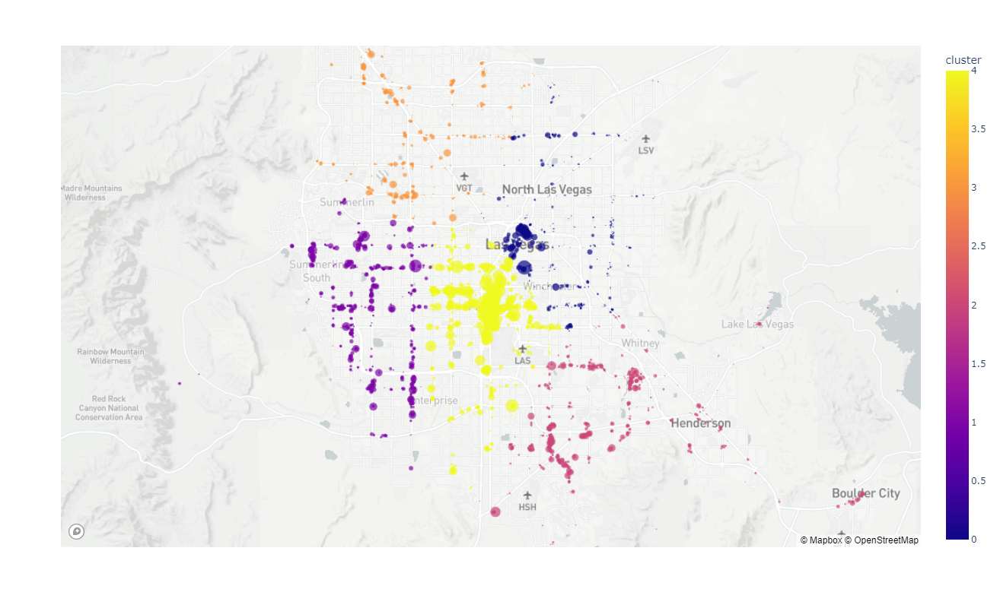

In [26]:
px.scatter_mapbox(lasVegas, lat="latitude", lon="longitude", color="cluster", size='review_count', 
                  hover_data= ['name', 'latitude', 'longitude'], zoom=10, width=1200, height=800)

## Location-Based Recommendation

In [27]:
top_restaurants_lasVegas = lasVegas.sort_values(by=['review_count', 'stars'], ascending=False)
top_restaurants_lasVegas.head()

,business_id,name,address,city,state,postal_code,latitude,longitude,stars,review_count,is_open,attributes,categories,hours,Restaurants,cluster
82250,4JNXUYY8wbaaDmk3BPzlWw,Mon Ami Gabi,3655 Las Vegas Blvd S,Las Vegas,NV,89109,36.112859,-115.172434,4.0,8348,1,"{'Corkage': 'True', 'RestaurantsDelivery': 'Fa...","Food, French, Breakfast & Brunch, Restaurants,...","{'Monday': '7:0-23:0', 'Tuesday': '7:0-23:0', ...",True,4
89206,RESDUcs7fIiihp38-d6_6g,Bacchanal Buffet,3570 S Las Vegas Blvd,Las Vegas,NV,89109,36.116113,-115.176222,4.0,8339,1,"{'NoiseLevel': 'u'average'', 'HasTV': 'False',...","Restaurants, Buffets, Sandwiches, Food, Breakf...","{'Monday': '7:30-22:0', 'Tuesday': '7:30-22:0'...",True,4
35199,K7lWdNUhCbcnEvI0NhGewg,Wicked Spoon,3708 Las Vegas Blvd S,Las Vegas,NV,89109,36.109550,-115.176155,3.5,6708,1,"{'GoodForKids': 'True', 'RestaurantsPriceRange...","Buffets, Breakfast & Brunch, Restaurants","{'Monday': '8:0-21:0', 'Tuesday': '8:0-21:0', ...",True,4
58852,f4x1YBxkLrZg652xt2KR5g,Hash House A Go Go,3535 Las Vegas Blvd,Las Vegas,NV,89109,36.118181,-115.171580,4.0,5763,1,"{'BusinessAcceptsCreditCards': 'True', 'Restau...","Breakfast & Brunch, Food, Restaurants, America...","{'Monday': '0:0-0:0', 'Tuesday': '0:0-0:0', 'W...",True,4
141820,cYwJA2A6I12KNkm2rtXd5g,Gordon Ramsay BurGR,3667 Las Vegas Blvd S,Las Vegas,NV,89109,36.110724,-115.172169,4.0,5484,0,"{'RestaurantsGoodForGroups': 'True', 'Alcohol'...","Restaurants, Burgers, American (Traditional)","{'Monday': '11:0-0:0', 'Tuesday': '11:0-0:0', ...",True,4


In [29]:
def recommend_restaurants(df, longitude, latitude):
    # Predict the cluster for longitude and latitude provided
    cluster = kmeans.predict(np.array([longitude,latitude]).reshape(1,-1))[0]
    print(cluster)
   
    # Get the best restaurant in this cluster
    return  df[df['cluster']==cluster].iloc[0:5][['name', 'latitude','longitude'	]]
   

In [30]:
recommend_restaurants(top_restaurants_lasVegas,-115.1891691,  36.1017316)

4


,name,latitude,longitude
82250,Mon Ami Gabi,36.112859,-115.172434
89206,Bacchanal Buffet,36.116113,-115.176222
35199,Wicked Spoon,36.109550,-115.176155
58852,Hash House A Go Go,36.118181,-115.171580
141820,Gordon Ramsay BurGR,36.110724,-115.172169


In [31]:
recommend_restaurants(top_restaurants_lasVegas,-115.2798544, 36.0842838) 

1


,name,latitude,longitude
131069,Hash House A Go Go,36.144713,-115.240092
116890,Echo & Rig,36.166576,-115.286232
42288,Red Rock Casino Resort & Spa,36.156413,-115.332847
11169,Juan's Flaming Fajitas & Cantina,36.100509,-115.302689
9191,Honey Salt,36.160577,-115.292996


In [32]:
recommend_restaurants(top_restaurants_lasVegas, 	-115.082821, 36.155011 )

0


,name,latitude,longitude
111864,Lotus of Siam,36.143664,-115.141891
79764,Eat.,36.166900,-115.138977
127088,Pizza Rock,36.171618,-115.142267
55675,Carson Kitchen,36.167878,-115.140640
160676,Golden Nugget,36.169781,-115.145534


In [33]:
test_coordinates = {
    'user': [1, 2, 3], 
    'latitude' : [36.1017316, 36.0842838, 36.155011],
    'longitude' : [-115.1891691, -115.2798544, -115.082821],
}

test_df = pd.DataFrame(test_coordinates)
test_df

,user,latitude,longitude
0,1,36.101732,-115.189169
1,2,36.084284,-115.279854
2,3,36.155011,-115.082821


In [34]:
user1 = test_df[test_df['user'] == 1]
user1

,user,latitude,longitude
0,1,36.101732,-115.189169


4


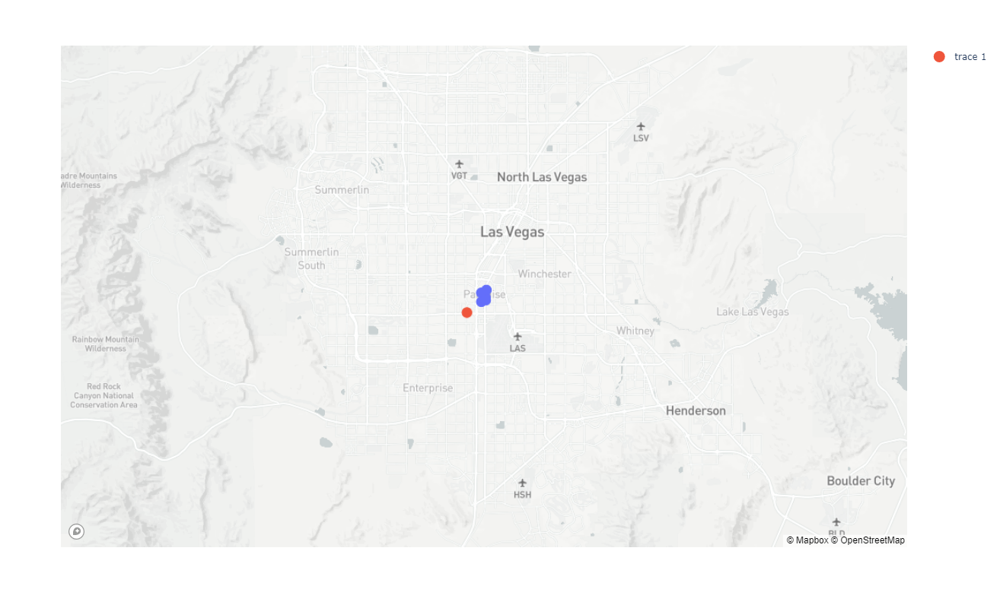

In [35]:
fig = px.scatter_mapbox(recommend_restaurants(top_restaurants_lasVegas, user1.longitude, user1.latitude), lat="latitude", lon="longitude",  
                   zoom=10, width=1200, height=800, hover_data= ['name', 'latitude', 'longitude'])
fig.add_scattermapbox(lat=user1["latitude"], lon= user1["longitude"]).update_traces(dict(mode='markers', marker = dict(size = 15)))

1


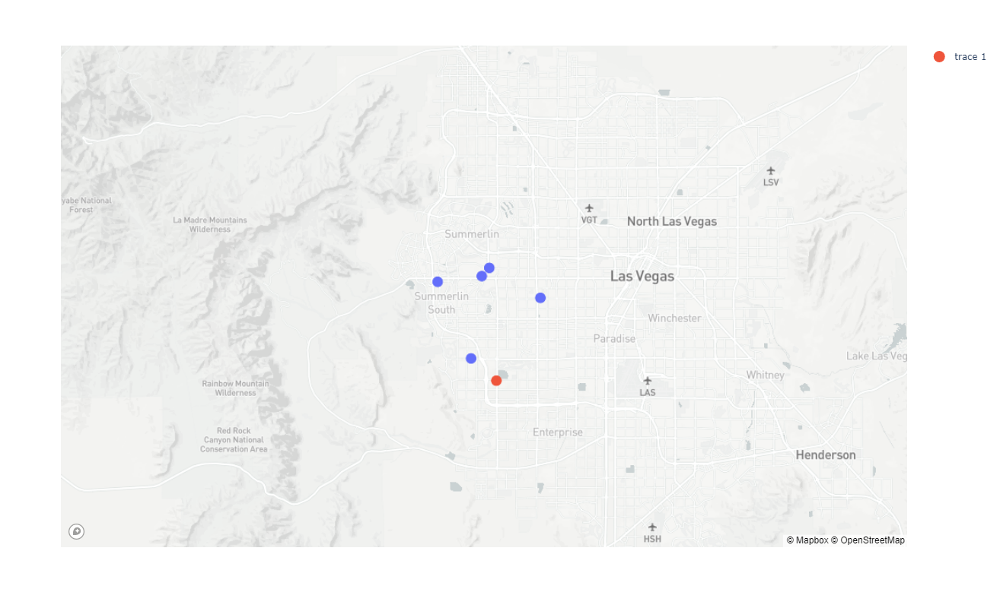

In [36]:
user2 = test_df[test_df['user'] == 2].reset_index()
fig = px.scatter_mapbox(recommend_restaurants(top_restaurants_lasVegas, user2.longitude, user2.latitude), lat="latitude", lon="longitude",  
                   zoom=10, width=1200, height=800, hover_data= ['name', 'latitude', 'longitude'])
fig.add_scattermapbox(lat=user2["latitude"], lon= user2["longitude"]).update_traces(dict(mode='markers', marker = dict(size = 15)))

In [37]:
user3 = test_df[test_df['user'] == 2].reset_index()
fig = px.scatter_mapbox(recommend_restaurants(top_restaurants_lasVegas, user3.longitude, user3.latitude), lat="latitude", lon="longitude",  
                   zoom=10, width=1200, height=800, hover_data= ['name', 'latitude', 'longitude'])
fig.add_scattermapbox(lat=user3["latitude"], lon= user3["longitude"]).update_traces(dict(mode='markers', marker = dict(size = 15)))

1
